In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

from utilities.loaders import (
    load_corpus,
    get_chars,
    load_lookup_array,
    save_lookup_array,
    load_meta_data,
    save_meta_data,
    get_top_models,
    load_model,
    save_model,
    create_metrics_df,
    create_classified_df)

from utilities.preprocessors import (
    remove_contractions,
    rem_non_alpha_num,
    rem_numeric,
    capitalize,
    filter_valid,
    partition_corpus,
    rem_stop_words,
    stem_corpus_words,
    lemmatize_corpus_words,
    strip_final_corpus,
    string_list_to_list,
    join_word_list,
    clean_tweets,
    lower_words,
    flatten_series_of_lists,
    decode_one_hot,
    re_encode_sparse_labels,
    translate_labels,
    encode_features,
    vectorize_sent)


from utilities.visualizers import (
    view_words,
    data_split_metric_values,
    view_value_frequency,
    multi_class_heatmap,
    view_metric_values,
    view_classified_labels,
    view_label_freq,
    describe_col,
    ModelResults,
    plot_all_features,
    view_all_splits_results)


%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load preprocessors

In [99]:
saved_ddr_vectorizer = load_model('./saved/misc/ddr_tfidf_vec.pkl')

# Load trained models

In [100]:
saved_ada_clf = load_model('./saved/models/ada_clf.pkl')
saved_lgbm_clf = load_model('./saved/models/lgbm_clf.pkl')
saved_xgb_clf = load_model('./saved/models/xgb_clf.pkl')

# Load decoders

In [101]:
saved_ddr_le = load_model('./saved/misc/ddr_le.pkl')

# Loading data

In [102]:
ddr = pd.read_csv('./data/depression_dataset_reddit_cleaned.csv', )
ddr

,clean_text,is_depression
0,we understand that most people who reply immed...,1
1,welcome to r depression s check in post a plac...,1
2,anyone else instead of sleeping more when depr...,1
3,i ve kind of stuffed around a lot in my life d...,1
4,sleep is my greatest and most comforting escap...,1
...,...,...
7726,is that snow,0
7727,moulin rouge mad me cry once again,0
7728,trying to shout but can t find people on the list,0
7729,ughh can t find my red sox hat got ta wear thi...,0


# Preprocessing data

In [103]:
ddr.rename(columns={'is_depression': 'label'}, inplace=True)
ddr

,clean_text,label
0,we understand that most people who reply immed...,1
1,welcome to r depression s check in post a plac...,1
2,anyone else instead of sleeping more when depr...,1
3,i ve kind of stuffed around a lot in my life d...,1
4,sleep is my greatest and most comforting escap...,1
...,...,...
7726,is that snow,0
7727,moulin rouge mad me cry once again,0
7728,trying to shout but can t find people on the list,0
7729,ughh can t find my red sox hat got ta wear thi...,0


In [104]:
ddr['clean_text'] = ddr['clean_text'].apply(lower_words)
ddr['clean_text'] = ddr['clean_text'].apply(remove_contractions)
ddr['clean_text'] = ddr['clean_text'].apply(rem_non_alpha_num)
ddr['clean_text'] = ddr['clean_text'].apply(rem_numeric)
ddr['clean_text'] = ddr['clean_text'].apply(rem_stop_words)
ddr['clean_text'] = ddr['clean_text'].apply(stem_corpus_words)
ddr['clean_text'] = ddr['clean_text'].apply(lemmatize_corpus_words)
ddr['clean_text'] = ddr['clean_text'].apply(strip_final_corpus)
ddr['label'] = re_encode_sparse_labels(ddr['label'], new_labels=['NDP', 'DPR'])

we understand that most people who reply immediately to an op with an invitation to talk privately mean only to help but this type of response usually lead to either disappointment or disaster it usually work out quite differently here than when you say pm me anytime in a casual social context we have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content even more so because we know that so many of you are struggling yourselves we re hard at work behind the scene on more information and resource to make it easier to give and get quality help here this is just a small start our new wiki page explains in detail why it s much better to respond in public comment at least until you ve gotten to know someone it will be maintained at r depression wiki private contact and the full text of the current version is below summary anyone who while acting a a helper invite or accepts private contact i e pm chat 

In [105]:
ddr

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,DPR
1,welcom r depress check post place take moment ...,DPR
2,anyon el instead sleep depress stay night avoi...,DPR
3,kind stuf around lot life delay inevit work jo...,DPR
4,sleep greatest comfort escap whenev wake day l...,DPR
...,...,...
7726,snow,NDP
7727,moulin roug mad cri,NDP
7728,tri shout find peopl list,NDP
7729,ughh find red sox hat got ta wear creepi nick ...,NDP


In [106]:
ddr['label'] = saved_ddr_le.transform(ddr['label'])
ddr

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,0
1,welcom r depress check post place take moment ...,0
2,anyon el instead sleep depress stay night avoi...,0
3,kind stuf around lot life delay inevit work jo...,0
4,sleep greatest comfort escap whenev wake day l...,0
...,...,...
7726,snow,1
7727,moulin roug mad cri,1
7728,tri shout find peopl list,1
7729,ughh find red sox hat got ta wear creepi nick ...,1


In [107]:
X_trains, X_, Y_trains, Y_ = train_test_split(ddr['clean_text'], ddr['label'], test_size=0.3, random_state=0)
X_cross, X_tests, Y_cross, Y_tests = train_test_split(X_, Y_, test_size=0.5, random_state=0)

In [126]:
X_trains

6778                        tombot never mind work anyway
189     hey everyon long time reader sub wan na say fi...
4521                                       got text sarah
7083       andr riue neighbour ha world come internet lol
6885                      play pkr onlin poker ha headach
                              ...                        
4931    morn starv die cuppa co doc fast blood test littl
3264                                              depress
1653    tw mention anxieti ocd allerg reaction back st...
2607    noth life good school shit quit weed witch wa ...
2732    depress bad function proper shower everi day b...
Name: clean_text, Length: 5411, dtype: object

In [108]:
X_trains_vec = saved_ddr_vectorizer.transform(X_trains)
X_cross_vec = saved_ddr_vectorizer.transform(X_cross)
X_tests_vec = saved_ddr_vectorizer.transform(X_tests)

In [109]:
X_cross_vec.shape

(1160, 12061)

In [110]:
np.unique(X_cross_vec.toarray())

array([0.        , 0.0086983 , 0.00920788, ..., 0.96013761, 0.97911064,
       1.        ])

# Testing models

In [111]:
ddr_lgbm_Y_preds_train = saved_lgbm_clf.predict(X_trains_vec)
ddr_lgbm_Y_preds_cross = saved_lgbm_clf.predict(X_cross_vec)
ddr_lgbm_Y_preds_test = saved_lgbm_clf.predict(X_tests_vec)

In [112]:
train_lgbm_metric_values = data_split_metric_values(Y_trains, ddr_lgbm_Y_preds_train)
cross_lgbm_metric_values = data_split_metric_values(Y_cross, ddr_lgbm_Y_preds_cross)
test_lgbm_metric_values = data_split_metric_values(Y_tests, ddr_lgbm_Y_preds_test)
train_lgbm_metric_values

{'accuracy': 0.9931620772500462,
 'precision': 0.9932342526595124,
 'recall': 0.9931620772500462,
 'f1': 0.9931611982665395,
 'roc-auc': 0.9930692298126971}

In [113]:
lgbm_metrics_df = create_metrics_df(list(train_lgbm_metric_values.values()),
                  list(cross_lgbm_metric_values.values()),
                  list(test_lgbm_metric_values.values()),
                  metrics=['accuracy', 'precision', 'recall', 'f1-score', 'roc-auc'])

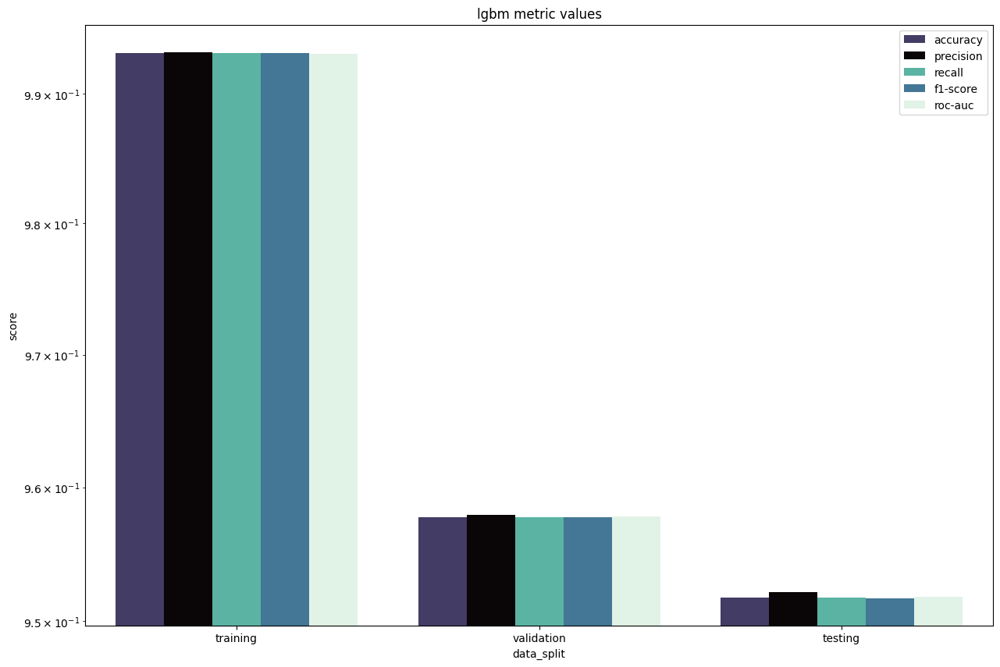

In [114]:
view_metric_values(lgbm_metrics_df, 'lgbm metric values', save_img=True)

In [115]:
lgbm_train_conf_matrix = confusion_matrix(Y_trains, ddr_lgbm_Y_preds_train)
lgbm_cross_conf_matrix = confusion_matrix(Y_cross, ddr_lgbm_Y_preds_cross)
lgbm_test_conf_matrix = confusion_matrix(Y_tests, ddr_lgbm_Y_preds_test)

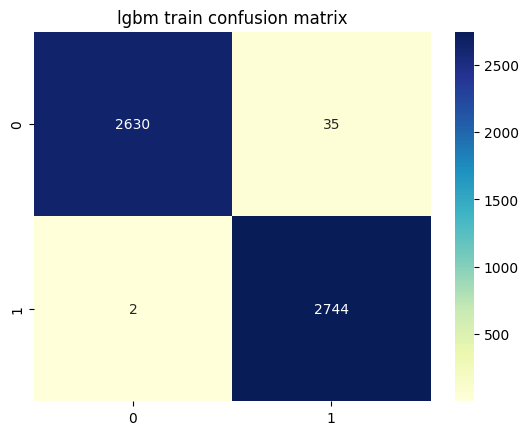

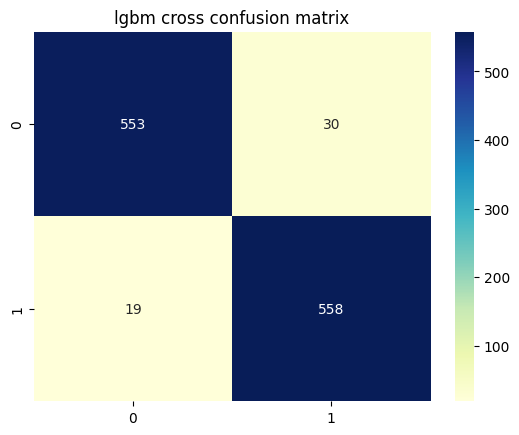

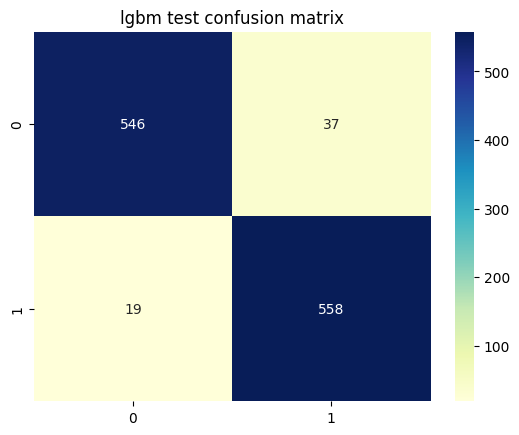

In [116]:
multi_class_heatmap(lgbm_train_conf_matrix, img_title='lgbm train confusion matrix', save_img=True)
multi_class_heatmap(lgbm_cross_conf_matrix, img_title='lgbm cross confusion matrix', save_img=True)
multi_class_heatmap(lgbm_test_conf_matrix, img_title='lgbm test confusion matrix', save_img=True)

In [117]:
ddr_xgb_Y_preds_train = saved_xgb_clf.predict(X_trains_vec)
ddr_xgb_Y_preds_cross = saved_xgb_clf.predict(X_cross_vec)
ddr_xgb_Y_preds_test = saved_xgb_clf.predict(X_tests_vec)

In [118]:
np.unique(ddr_xgb_Y_preds_train)

array([0])

In [119]:
train_xgb_metric_values = data_split_metric_values(Y_trains, ddr_xgb_Y_preds_train)
cross_xgb_metric_values = data_split_metric_values(Y_cross, ddr_xgb_Y_preds_cross)
test_xgb_metric_values = data_split_metric_values(Y_tests, ddr_xgb_Y_preds_test)
train_lgbm_metric_values

c:\ProgramData\Anaconda3\envs\depressive-sentiment-analyzer\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\Anaconda3\envs\depressive-sentiment-analyzer\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\ProgramData\Anaconda3\envs\depressive-sentiment-analyzer\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

{'accuracy': 0.9931620772500462,
 'precision': 0.9932342526595124,
 'recall': 0.9931620772500462,
 'f1': 0.9931611982665395,
 'roc-auc': 0.9930692298126971}

In [120]:
cross_xgb_metric_values

{'accuracy': 0.5025862068965518,
 'precision': 0.2525928953626635,
 'recall': 0.5025862068965518,
 'f1': 0.3362108532652779,
 'roc-auc': 0.5}

In [121]:
xgb_metrics_df = create_metrics_df(list(train_xgb_metric_values.values()),
                  list(cross_xgb_metric_values.values()),
                  list(test_xgb_metric_values.values()),
                  metrics=['accuracy', 'precision', 'recall', 'f1-score', 'roc-auc'])

In [122]:
xgb_metrics_df

,data_split,accuracy,precision,recall,f1-score,roc-auc
0,training,0.492515,0.242571,0.492515,0.325050,0.5
1,validation,0.502586,0.252593,0.502586,0.336211,0.5
2,testing,0.502586,0.252593,0.502586,0.336211,0.5


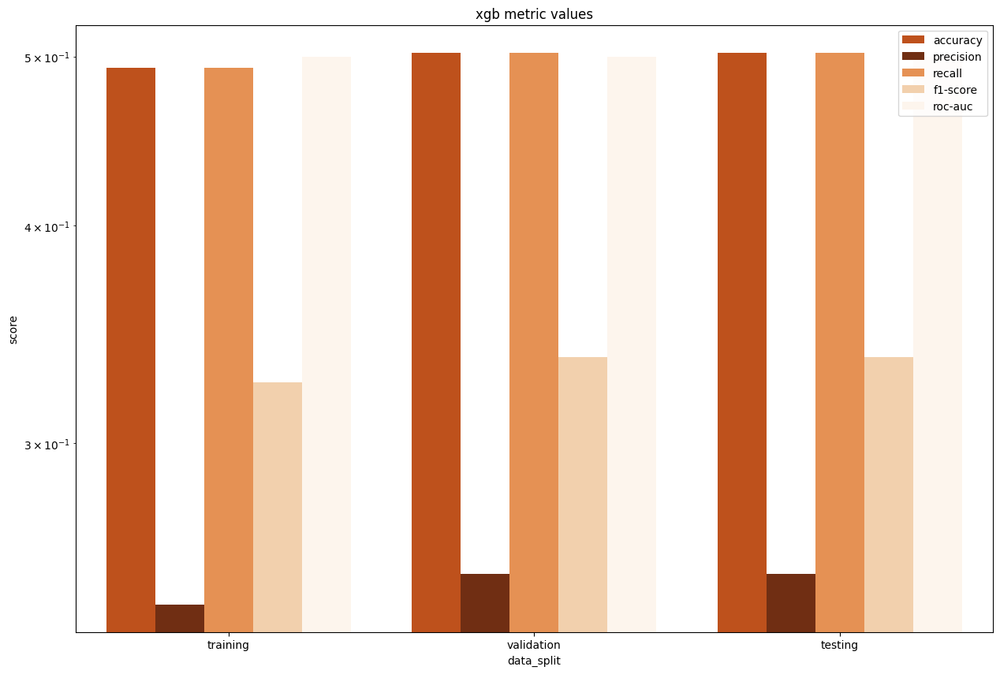

In [123]:
view_metric_values(xgb_metrics_df, 'xgb metric values', save_img=True, colormap='Oranges_r')

In [124]:
xgb_train_conf_matrix = confusion_matrix(Y_trains, ddr_xgb_Y_preds_train)
xgb_cross_conf_matrix = confusion_matrix(Y_cross, ddr_xgb_Y_preds_cross)
xgb_test_conf_matrix = confusion_matrix(Y_tests, ddr_xgb_Y_preds_test)

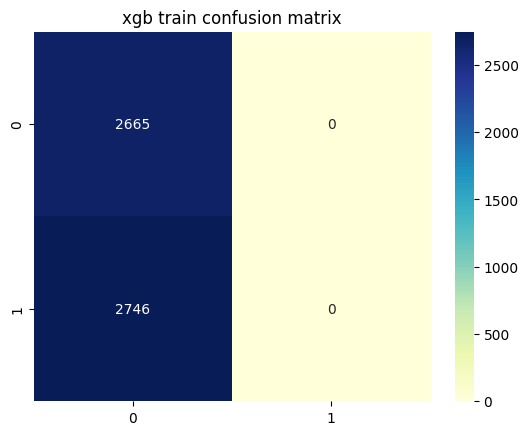

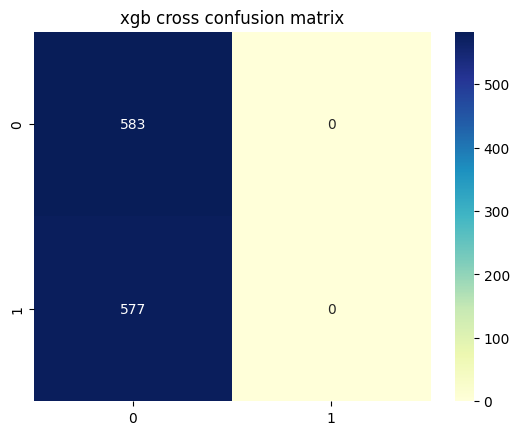

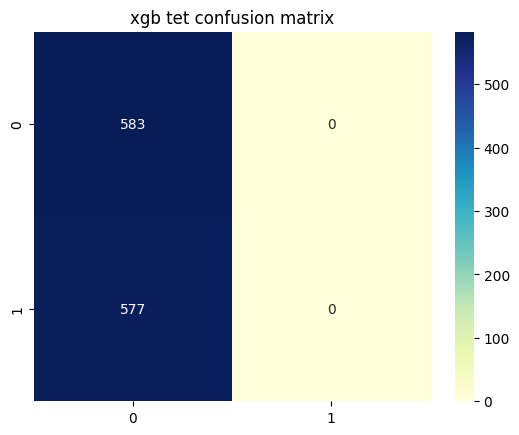

In [125]:
multi_class_heatmap(xgb_train_conf_matrix, img_title='xgb train confusion matrix', save_img=True)
multi_class_heatmap(xgb_cross_conf_matrix, img_title='xgb cross confusion matrix', save_img=True)
multi_class_heatmap(xgb_test_conf_matrix, img_title='xgb tet confusion matrix', save_img=True)